<a href="https://colab.research.google.com/github/Bicchie/Skin-Lesions-Classification/blob/main/10_Explainability.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Explainability

In this notebook we are going to analyze how the models take their decisions in order to classify the images.

## Initialization

In [ ]:
from google.colab import drive
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import optimizers
import random as rn
from keras import layers
from keras import models
from matplotlib import cm 
import os
import math
import shutil
import matplotlib.pyplot as plt
from sklearn import metrics
from sklearn.metrics import ConfusionMatrixDisplay
import numpy as np
import matplotlib.image as mpimg
from keras.models import Model
from tensorflow.keras.preprocessing import image
from skimage.segmentation import mark_boundaries

In [ ]:
drive.mount('/content/gdrive', force_remount=True)

Mounted at /content/gdrive


In [ ]:
IMAGE_HEIGHT = 224
IMAGE_WIDTH = 224
IMAGE_SIZE = [224,224]
SETS_DIR = '/content/gdrive/MyDrive/SkinCancer/OriginalDataset'
TEST_DIR = '/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test'
CLASSES = ['Actinic', 'BCC', 'Dermatofibroma', 'Keratosis', 'Melanoma', 'Nevu', 'Vascular']
BATCH_SIZE = 32
RANDOM_SEED = 42
EPOCHS=50
DROPOUT = 0.3

In [ ]:
test_images = tf.keras.preprocessing.image_dataset_from_directory(
    TEST_DIR,
    labels='inferred',
    batch_size=BATCH_SIZE,
    color_mode='rgb',
    image_size=(IMAGE_HEIGHT,IMAGE_WIDTH),
    interpolation='bilinear',
    shuffle=False,
    seed=RANDOM_SEED
)

Found 1511 files belonging to 7 classes.


## Model and Images Loading

Load the best model for each approach.

In [ ]:
vgg_model = models.load_model('/content/gdrive/MyDrive/SkinCancer/Models/VGG/FT_LastBlock.h5')
inception_model = models.load_model('/content/gdrive/MyDrive/SkinCancer/Models/Inception/FT_Last1.h5')
densenet_model = models.load_model('/content/gdrive/MyDrive/SkinCancer/Models/DenseNet/FT_LastWhole.h5')
resnet_model = models.load_model('/content/gdrive/MyDrive/SkinCancer/Models/ResNet/FT_LastWhole.h5')

Load one image for each class.

### Actinic

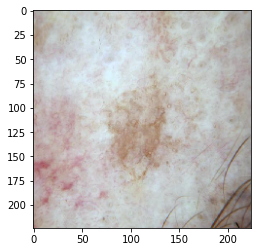

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/Actinic/ISIC_0024948.jpg


In [ ]:
image_actinic = os.listdir(SETS_DIR + '/test/Actinic')[7]
img_path_actinic = SETS_DIR + '/test/Actinic/' + image_actinic
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_actinic , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_actinic = image.img_to_array(img)
img_tensor_actinic = np.expand_dims(img_tensor_actinic , axis=0) # add batch dimension
plt.imshow(img_tensor_actinic[0].astype('uint8'))
plt.show()
print(img_path_actinic)

### BCC

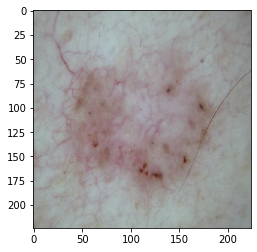

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/BCC/ISIC_0024448.jpg


In [ ]:
image_BCC = os.listdir(SETS_DIR + '/test/BCC')[0]
img_path_BCC = SETS_DIR + '/test/BCC/' + image_BCC
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_BCC , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_BCC = image.img_to_array(img)
img_tensor_BCC = np.expand_dims(img_tensor_BCC , axis=0) # add batch dimension
plt.imshow(img_tensor_BCC[0].astype('uint8'))
plt.show()
print(img_path_BCC )

### Dermatofibroma

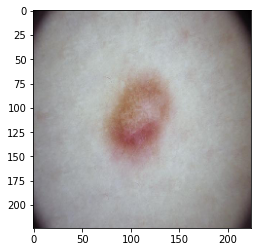

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/Dermatofibroma/ISIC_0034135.jpg


In [ ]:
image_dermatofibroma = os.listdir(SETS_DIR + '/test/Dermatofibroma')[6]
img_path_dermatofibroma = SETS_DIR + '/test/Dermatofibroma/' + image_dermatofibroma
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_dermatofibroma , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_dermatofibroma = image.img_to_array(img)
img_tensor_dermatofibroma = np.expand_dims(img_tensor_dermatofibroma , axis=0) # add batch dimension
plt.imshow(img_tensor_dermatofibroma[0].astype('uint8'))
plt.show()
print(img_path_dermatofibroma )

### Keratosis

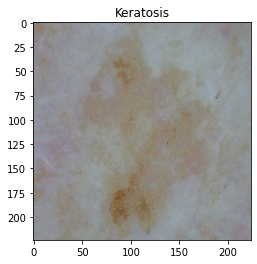

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/Keratosis/ISIC_0025810.jpg


In [ ]:
image_keratosis = os.listdir(SETS_DIR + '/test/Keratosis')[0]
img_path_keratosis = SETS_DIR + '/test/Keratosis/' + image_keratosis
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_keratosis , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_keratosis = image.img_to_array(img)
img_tensor_keratosis = np.expand_dims(img_tensor_keratosis , axis=0) # add batch dimension
plt.imshow(img_tensor_keratosis[0].astype('uint8'))
plt.title("Keratosis")
plt.show()
print(img_path_keratosis )

### Melanoma

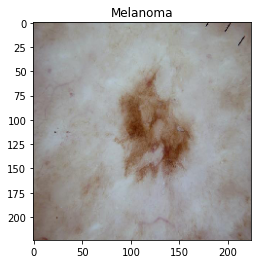

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/Melanoma/ISIC_0026009.jpg


In [ ]:
image_melanoma = os.listdir(SETS_DIR + '/test/Melanoma')[1]
img_path_melanoma = SETS_DIR + '/test/Melanoma/' + image_melanoma
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_melanoma , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_melanoma = image.img_to_array(img)
img_tensor_melanoma = np.expand_dims(img_tensor_melanoma , axis=0) # add batch dimension
plt.imshow(img_tensor_melanoma[0].astype('uint8'))
plt.title("Melanoma")
plt.show()
print(img_path_melanoma )

### Nevu

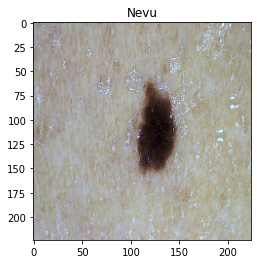

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/Nevu/ISIC_0024668.jpg


In [ ]:
image_nevu = os.listdir(SETS_DIR + '/test/Nevu')[0]
img_path_nevu = SETS_DIR + '/test/Nevu/' + image_nevu
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_nevu , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_nevu = image.img_to_array(img)
img_tensor_nevu = np.expand_dims(img_tensor_nevu , axis=0) # add batch dimension
plt.imshow(img_tensor_nevu[0].astype('uint8'))
plt.title("Nevu")
plt.show()
print(img_path_nevu )

### Vascular

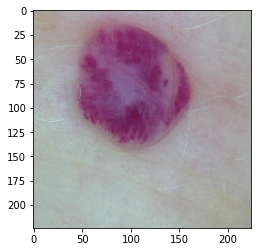

/content/gdrive/MyDrive/SkinCancer/OriginalDataset/test/Actinic/ISIC_0025264.jpg


In [ ]:
image_vascular = os.listdir(SETS_DIR + '/test/Vascular')[0]
img_path_vascular = SETS_DIR + '/test/Vascular/' + image_vascular
# We preprocess the image into a 4D tensor (adding batch dimension)
img = image.load_img(img_path_vascular , target_size=(IMAGE_HEIGHT, IMAGE_WIDTH))
img_tensor_vascular = image.img_to_array(img)
img_tensor_vascular = np.expand_dims(img_tensor_vascular , axis=0) # add batch dimension
plt.imshow(img_tensor_vascular[0].astype('uint8'))
plt.show()
print(img_path_actinic )

## Visualizing Intermediate Activations

Visualizing intermediate activations consists of displaying the feature maps that are output by various convolution and pooling layers in a network, given a certain input (the output of a layer is often called its activation, the output of the activation function).
The code is inspired by https://towardsdatascience.com/visualizing-intermediate-activation-in-convolutional-neural-networks-with-keras-260b36d60d0 .

In [ ]:
def get_activation_model_and_layer_name(model, base_model=0):
  '''
  get_activation_model_and_layer_name is used to get all the conv and max pooling 
  layers names and outputs and the activation model
  :param model: model considered
  :return: a tuple (activation_model, layer_names)
  '''
  layer_outputs = []
  layer_names = []

  if(base_model != 0):
    model = model.get_layer(base_model)

  for layer in model.layers:
      if isinstance(layer, (layers.Conv2D, layers.MaxPooling2D)):
          layer_outputs.append(layer.output)
          layer_names.append(layer.name)
  activation_model = keras.Model(inputs=model.input, outputs=layer_outputs)
  return activation_model, layer_names

The **activation model** is a model that when fed with an image input, returns the values of the layer activations in the original model.

In [ ]:
def print_activations(layer_names, activation_model, img_tensor, num_layers_to_show=3, images_per_row = 12):
  '''
  print_intermediate_activations is used to print the intermediate activations that
  are the output of the activation model
  :param layer_names: names of the layers
  :param activation_model: activation model used to get the convolutional and pooling layers activations
  :param img_tensor: tensor with the image
  :param last_layers_to_show
  :param images_per_row
  '''
  activations = activation_model.predict(img_tensor)

  counter_layers = 0

  for layer_name, layer_activation in zip(layer_names, activations):

      counter_layers += 1

      if num_layers_to_show:
        if counter_layers > num_layers_to_show and counter_layers < (len(activations) - num_layers_to_show):
          continue
        

      # Number of features in the feature map
      n_features = layer_activation.shape[-1]

      # The feature map has shape (1, image_height, image_width, n_features)
      size = layer_activation.shape[1]

      n_cols = n_features // images_per_row
      display_grid = np.zeros((size * n_cols, images_per_row * size))

      for col in range(n_cols):
          for row in range(images_per_row):
              channel_image = layer_activation[0,:, :, col * images_per_row + row]
              # post-processes the feature to make it visually palatable
              channel_image -= channel_image.mean() 
              channel_image /= channel_image.std() 
              # after this phase we have a standard normal distribution with 95% 
              # of pixel values in the interval [-2,2], multiply for 64 to get the interval [-128, 128]
              channel_image *= 64 
              # sum 128 to get the interval [0, 255]
              channel_image += 128
              channel_image = np.clip(channel_image, 0, 255).astype('uint8')
              display_grid[col * size : (col + 1) * size, row * size : (row + 1) * size] = channel_image

      # Display the grid
      scale = 1. / size
      plt.figure(figsize=(scale * display_grid.shape[1],
                          scale * display_grid.shape[0]))
      plt.title(layer_name)
      plt.grid(False)
      plt.imshow(display_grid, aspect='auto', cmap='gray')
      
  plt.show()

### VGG

In [ ]:
vgg_activation_model, vgg_layer_names = get_activation_model_and_layer_name(vgg_model, 'vgg16')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in true_divide


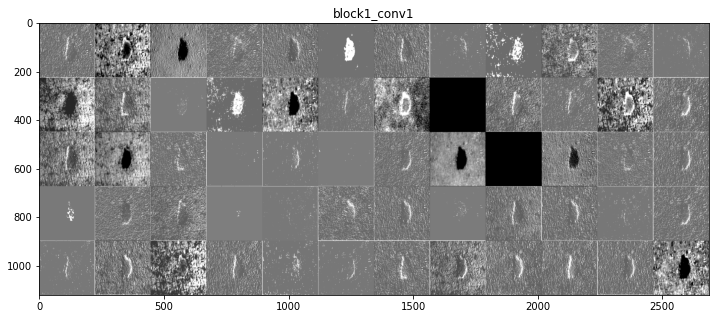

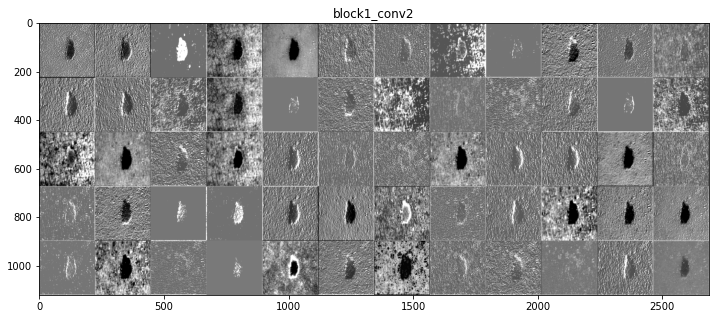

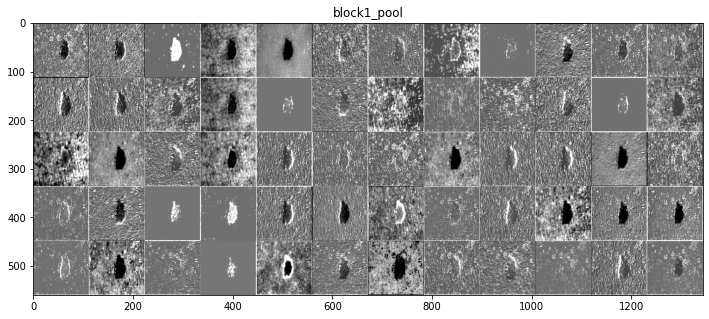

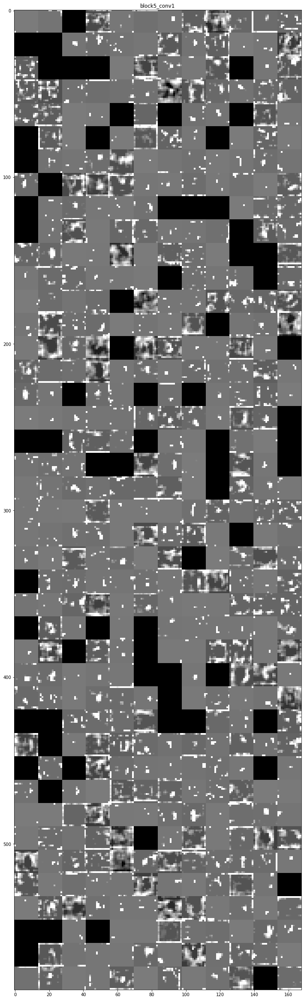

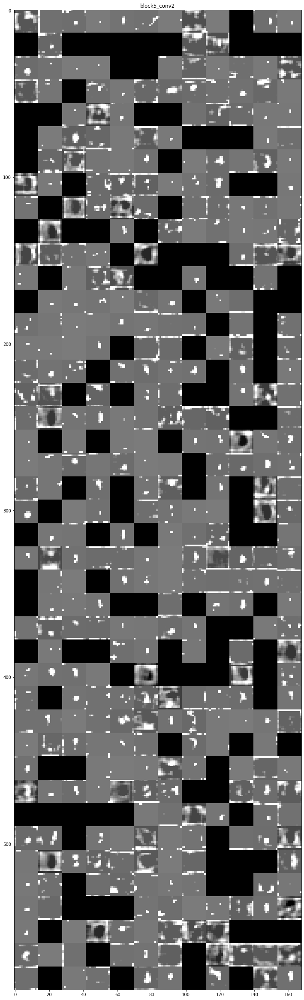

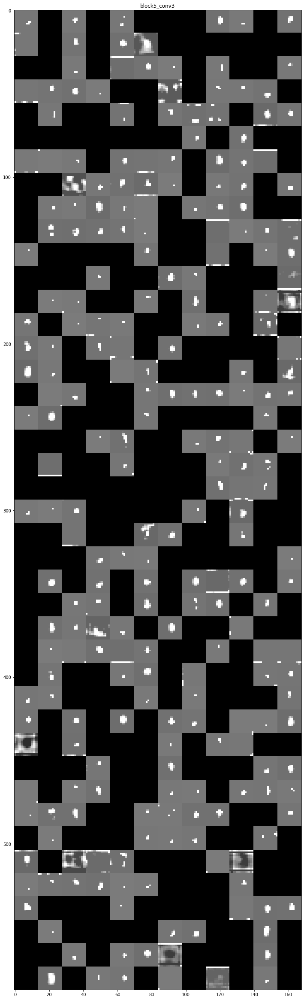

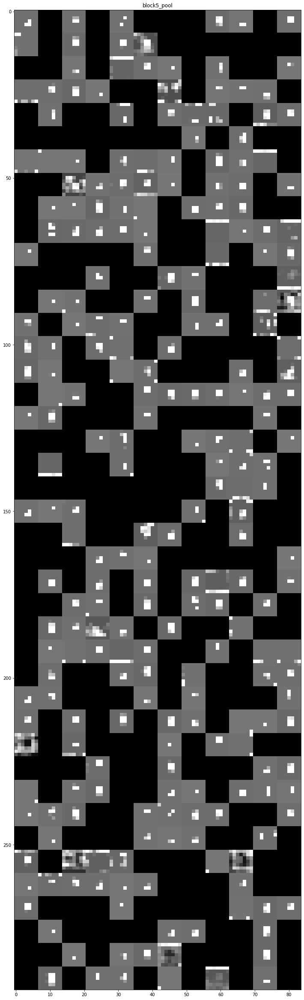

In [ ]:
print_activations(vgg_layer_names, vgg_activation_model, img_tensor_nevu)

### Inception

In [ ]:
inception_activation_model, inception_layer_names = get_activation_model_and_layer_name(inception_model, 'inception_v3')

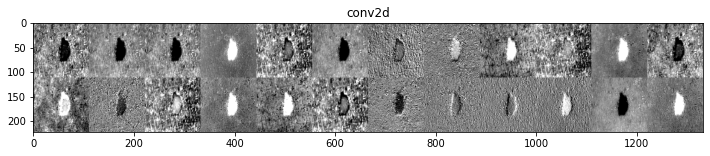

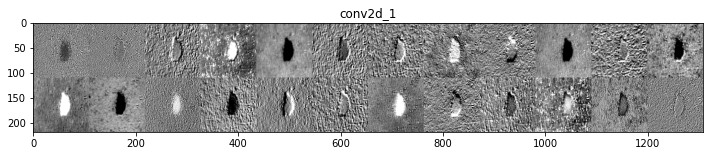

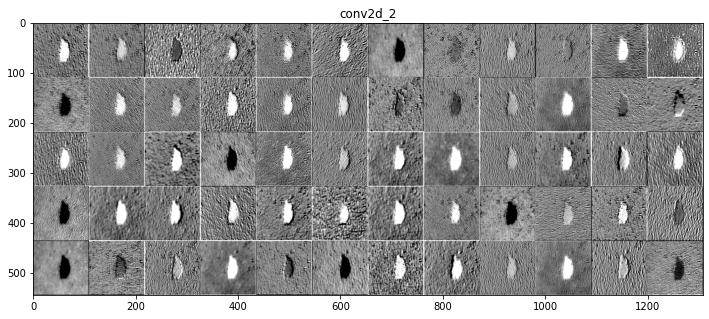

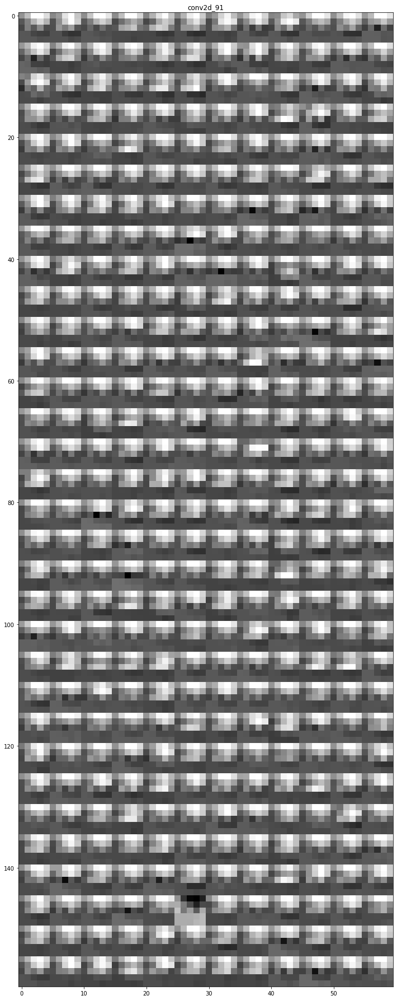

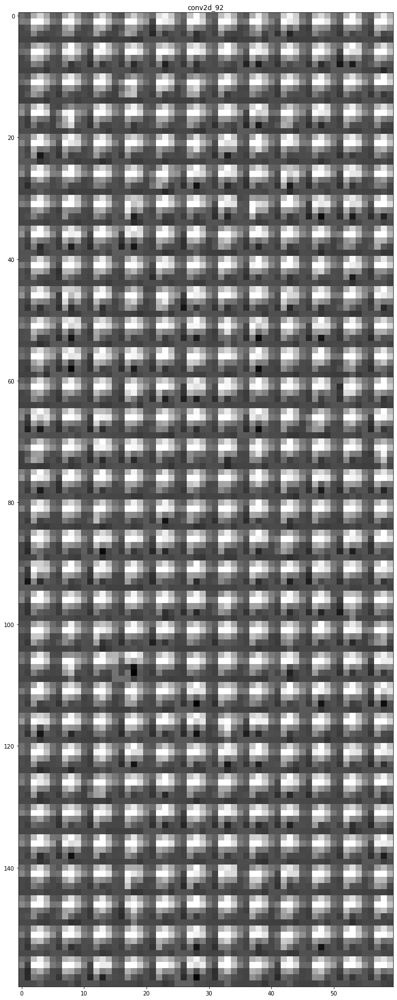

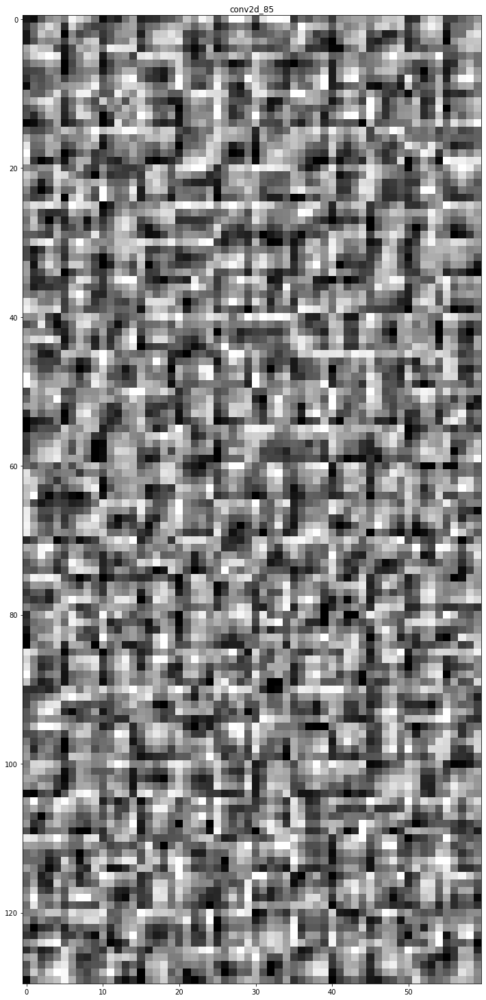

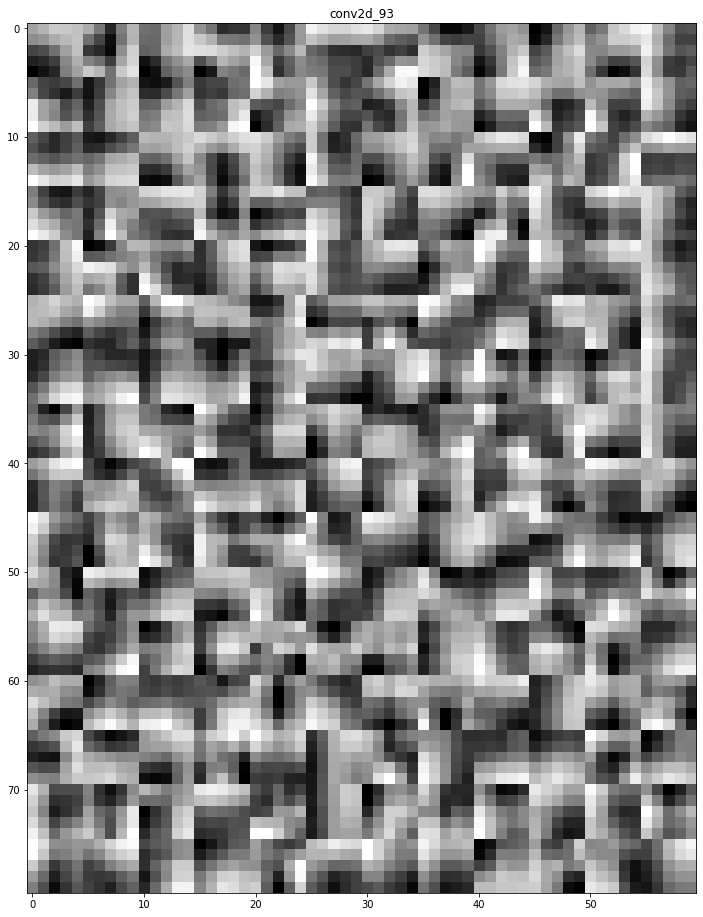

In [ ]:
print_activations(inception_layer_names, inception_activation_model, img_tensor_nevu)

### Densenet

In [ ]:
densenet_activation_model, densenet_layer_names = get_activation_model_and_layer_name(densenet_model, 'densenet121')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in true_divide


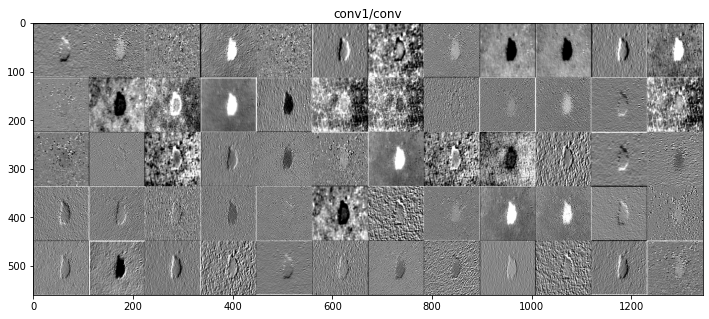

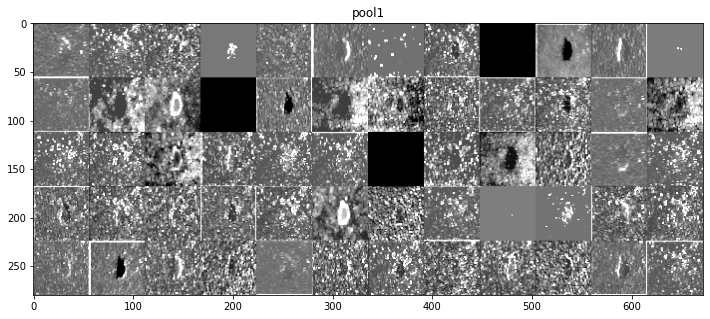

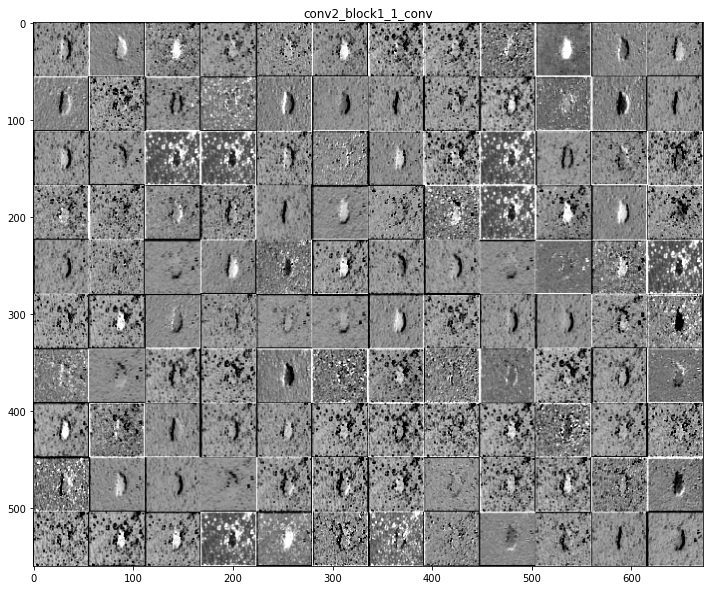

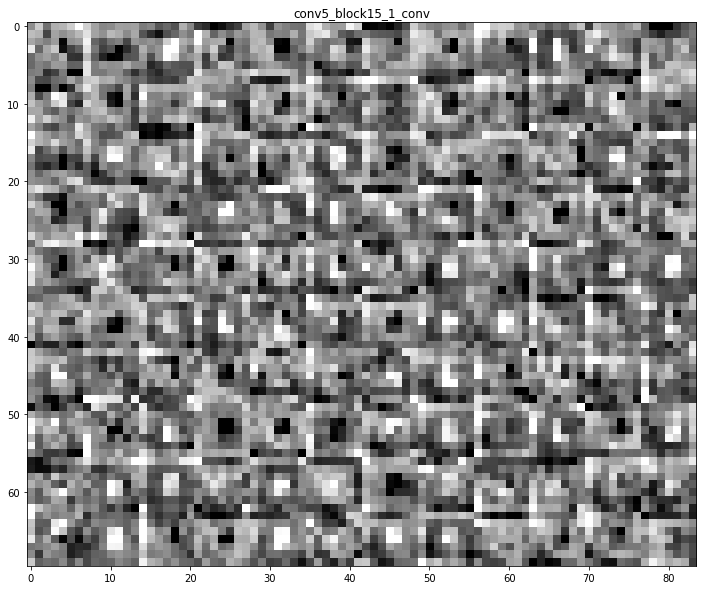

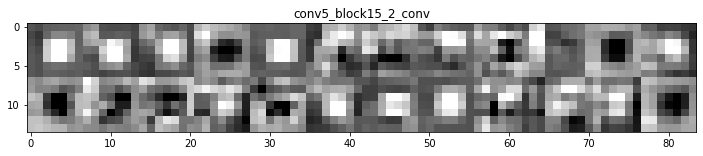

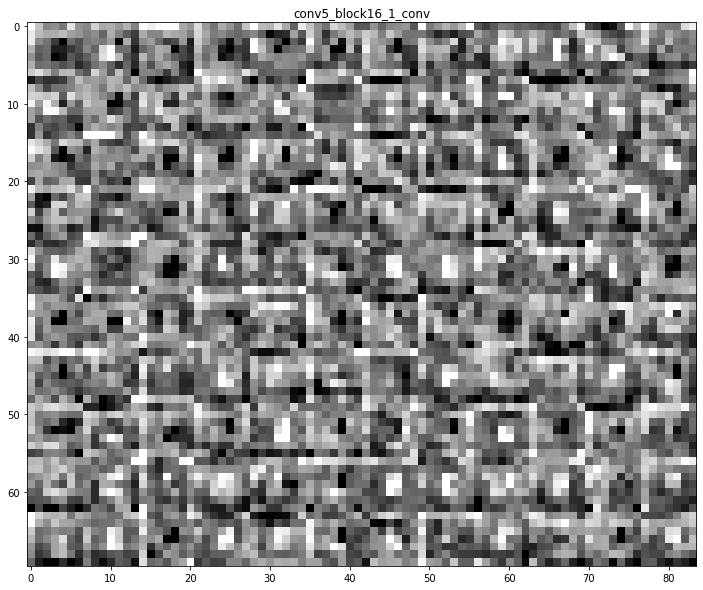

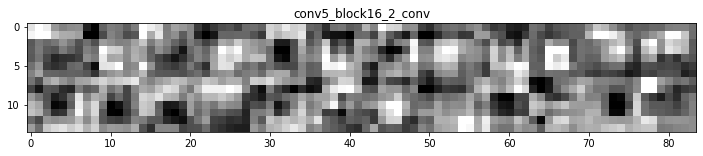

In [ ]:
print_activations(densenet_layer_names, densenet_activation_model, img_tensor_nevu)

### Resnet

In [ ]:
resnet_activation_model, resnet_layer_names = get_activation_model_and_layer_name(resnet_model, 'resnet50')

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:38: RuntimeWarning: invalid value encountered in true_divide


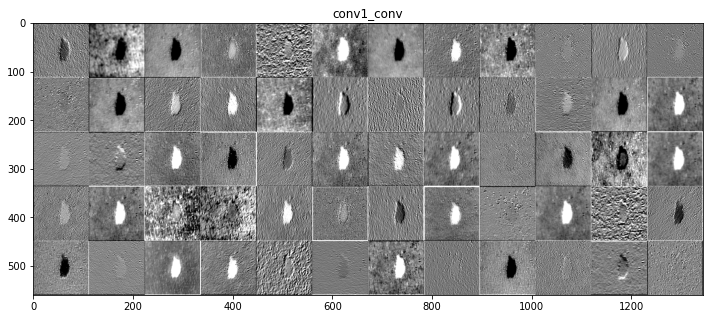

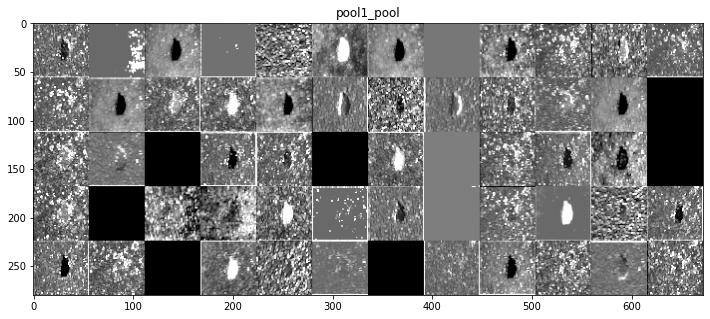

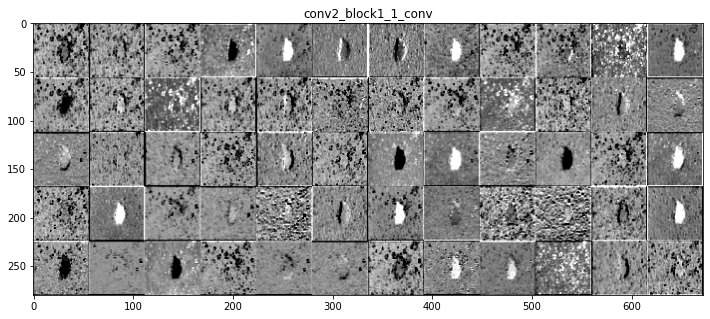

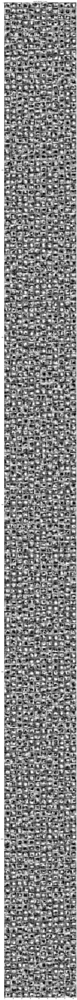

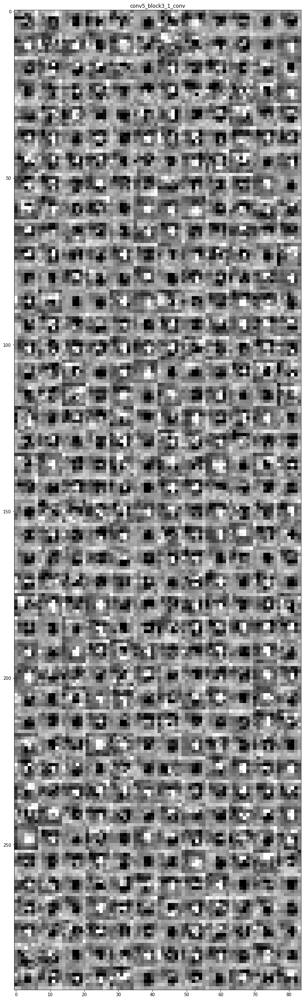

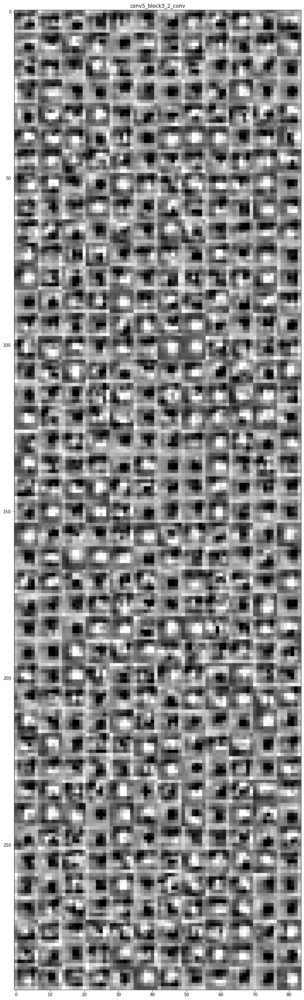

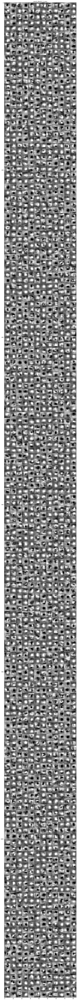

In [ ]:
print_activations(resnet_layer_names, resnet_activation_model, img_tensor_nevu)

## Heatmaps of class activation

This technique allows to understand the parts that are involved into the classification decision of the CNN.
The code is partially inspired by https://keras.io/examples/vision/grad_cam/ .

In [ ]:
def get_img_array(img_path, target_size):
  '''
  get_img_array returns the numpy array of the image
  :param img_path: path of the image
  :param target_size: size of the image (image is squared)
  :return: a numpy array
  '''
  img = keras.utils.load_img(img_path, target_size=target_size)
  array = keras.utils.img_to_array(img)
  array = np.expand_dims(array, axis=0)
  return array


def get_last_conv_layer_index (model):
  '''
  get_last_conv_layer_index is used to retrieve the index of the last convolutional layer of the model
  :param model: model considered
  :return: the index of the last convolutional layer
  '''
  index = 0
  i = 0
  for i, layer in enumerate(model.layers):
    if len(layer.output_shape) == 4: # we discriminate conv layer for the 4D dimension
      index = i 
  return index



def make_heatmap (img_array, model):

  '''
  make_heatmap is used to create the heatmap that shows the gradient-weighted class activation mapping
  :param img_array: a numpy array that represents the image
  :param model: model considered
  :param last_conv_layer_index: index of the last convolutional layer of the model
  :param class_index: class of the image 
  :return: the heatmap
  '''
  # We create a model that maps the input image to the activations of the last convolutional layer 
  # And a model that maps the input image to the predictions

  last_conv_layer_index = get_last_conv_layer_index(model)
  inputs_intermediate = model.inputs
  outputs_intermediate = model.layers[last_conv_layer_index + 1].input
  inputs_classifier = [model.layers[last_conv_layer_index + 1].input]
  outputs_classifier = model.output
 
  intermediate_layer_model = keras.Model(inputs=inputs_intermediate, outputs=outputs_intermediate)
  classifier_model = Model(inputs=inputs_classifier, outputs=outputs_classifier)
  # We compute the gradient of the predictions with respect to the activations of the last convolutional layer
  with tf.GradientTape() as tape:
    last_conv_layer_output = intermediate_layer_model(img_array) # output feature maps of the last conv layer.
    tape.watch(last_conv_layer_output)
    preds = classifier_model(last_conv_layer_output)  
    top_pred_index = tf.argmax(preds[0])  #  "african elephant" index
    top_class_channel = preds[:, top_pred_index] # "african elephant" prediction value
  grads = tape.gradient(top_class_channel, last_conv_layer_output) # gradient of the "african elephant" class with regard to the output feature maps of our last conv layer
  
  pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2)).numpy() # evaluate the mean over the gradient tensor, for each channel separately
  weighted_last_conv_layer_output = last_conv_layer_output.numpy()[0]
  for i in range(pooled_grads.shape[-1]):
    weighted_last_conv_layer_output[:, :, i] *= pooled_grads[i] # the i-th feature map is weighted with the i-th gradient

  heatmap = np.mean(weighted_last_conv_layer_output, axis=-1)
  heatmap = np.maximum(heatmap, 0)
  heatmap /= np.max(heatmap)
  return heatmap


def compute_gradcam(img_path, heatmap, alpha=0.4):
  '''
  compute_gradcam is used to superimpose the heatmap on top of the image
  :param img_path: where is located the image
  :param heatmap: heatmap precomputed 
  :return: the superimposed image
  '''
  img = keras.preprocessing.image.load_img(img_path)
  img = keras.preprocessing.image.img_to_array(img)

  # rescale heatmap to a range 0-255
  heatmap = np.uint8(255 * heatmap)

  # Use jet colormap to colorize heatmap
  jet = cm.get_cmap("jet")

  # Use RGB values of the colormap
  jet_colors = jet(np.arange(256))[:, :3]
  jet_heatmap = jet_colors[heatmap]

  # Create an image with RGB colorized heatmap
  jet_heatmap = keras.utils.array_to_img(jet_heatmap)
  jet_heatmap = jet_heatmap.resize((img.shape[1], img.shape[0]))
  jet_heatmap = keras.utils.img_to_array(jet_heatmap)

  # Superimpose the heatmap on original image
  superimposed_img = jet_heatmap * alpha + img
  superimposed_img = keras.utils.array_to_img(superimposed_img)
  return superimposed_img

def display_gradcam(img_path, heatmap, alpha=0.4):
  '''
  display_gradcam is used to print the heatmap of class activations
  :param img_path: where is located the image
  :param heatmap: heatmap precomputed 
  '''
  superimposed_img = compute_gradcam(img_path, heatmap, alpha)
  plt.figure(figsize= (10,10))
  plt.imshow(superimposed_img)

In [ ]:
def show_heatmap(img_array, index):
  vgg_predictions = vgg_model.predict(img_array)
  heatmap_vgg = make_heatmap(img_array, vgg_model)

  inception_predictions = inception_model.predict(img_array)
  heatmap_inception = make_heatmap(img_array, inception_model)

  densenet_predictions = densenet_model.predict(img_array)
  heatmap_densenet = make_heatmap(img_array, densenet_model)

  resnet_predictions = resnet_model.predict(img_array)
  heatmap_resnet = make_heatmap(img_array, resnet_model)

  fig = plt.figure(figsize=(10, 10))

  fig.add_subplot(2, 2, 1)
  plt.imshow(heatmap_vgg)
  plt.title("VGG: " + str(vgg_predictions[0][index]))

  fig.add_subplot(2, 2, 2)
  plt.imshow(heatmap_inception)
  plt.title("Inception: " + str(inception_predictions[0][index]))

  fig.add_subplot(2, 2, 3)
  plt.imshow(heatmap_resnet)
  plt.title("Resnet: " + str(densenet_predictions[0][index]))

  fig.add_subplot(2, 2, 4)
  plt.imshow(heatmap_densenet)
  plt.title("Densenet: " + str(resnet_predictions[0][index]))
  return heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet

In [ ]:
def show_gradcam(img_path, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet):
  vgg_gradcam = compute_gradcam(img_path, heatmap_vgg)
  inception_gradcam = compute_gradcam(img_path, heatmap_inception)
  densenet_gradcam = compute_gradcam(img_path, heatmap_densenet)
  resnet_gradcam = compute_gradcam(img_path, heatmap_resnet)

  fig = plt.figure(figsize=(10, 10))

  fig.add_subplot(2, 2, 1)
  plt.imshow(vgg_gradcam)
  plt.title("VGG")

  fig.add_subplot(2, 2, 2)
  plt.imshow(inception_gradcam)
  plt.title("Inception")

  fig.add_subplot(2, 2, 3)
  plt.imshow(densenet_gradcam)
  plt.title("Resnet")

  fig.add_subplot(2, 2, 4)
  plt.imshow(resnet_gradcam)
  plt.title("Densenet")

### Actinic

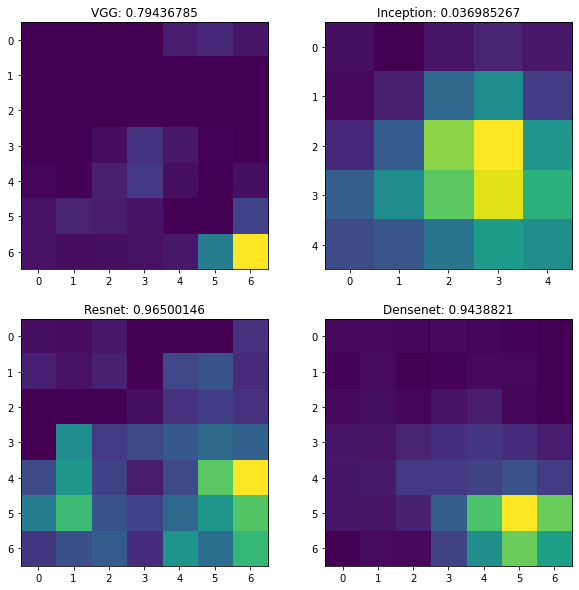

In [ ]:
img_array = get_img_array(img_path_actinic, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,0)

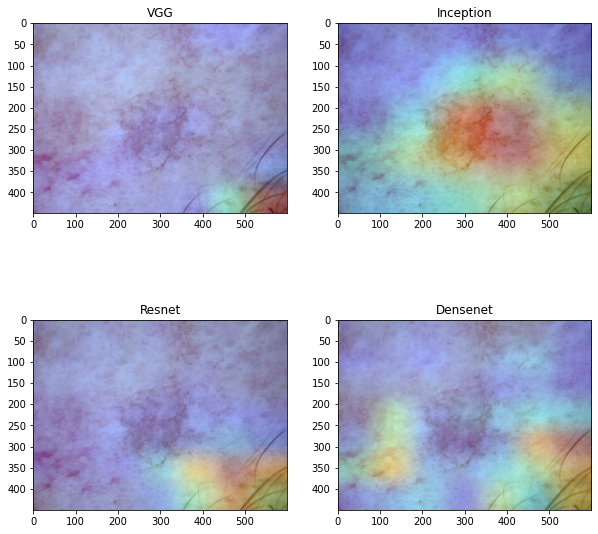

In [ ]:
show_gradcam(img_path_actinic, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)

### BCC

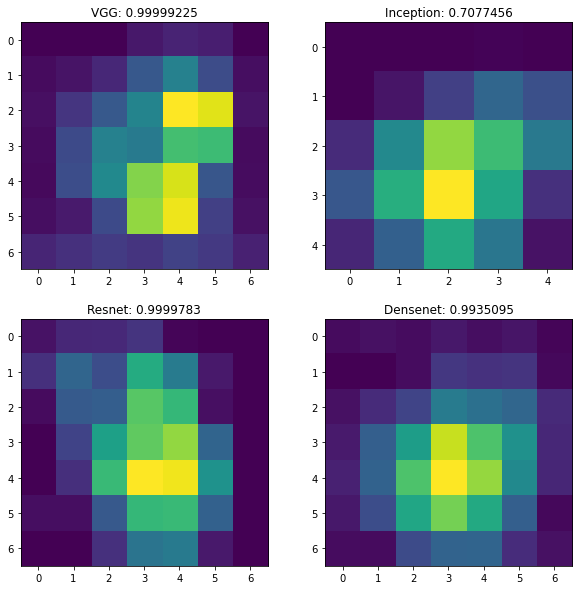

In [ ]:
img_array = get_img_array(img_path_BCC, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,1)

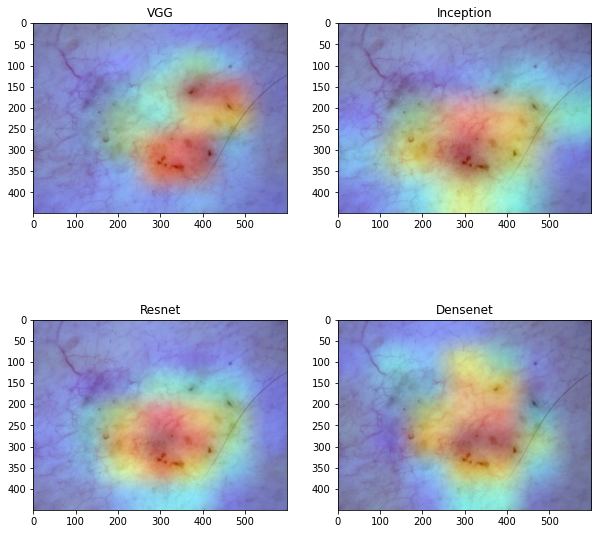

In [ ]:
show_gradcam(img_path_BCC, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)

### Dermatofibroma

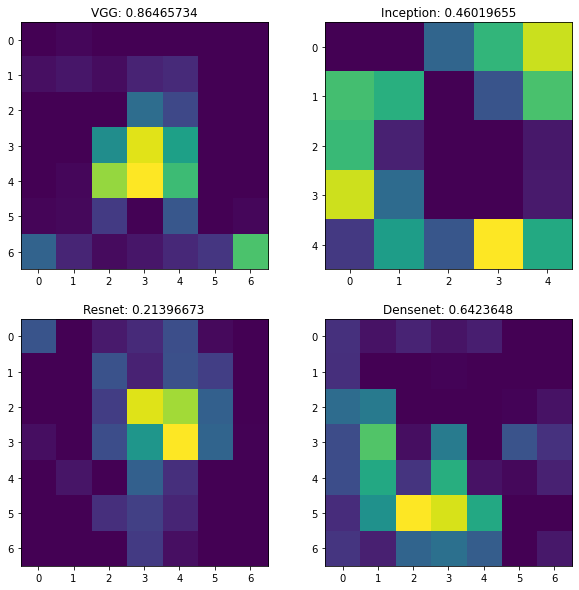

In [ ]:
img_array = get_img_array(img_path_dermatofibroma, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,2)

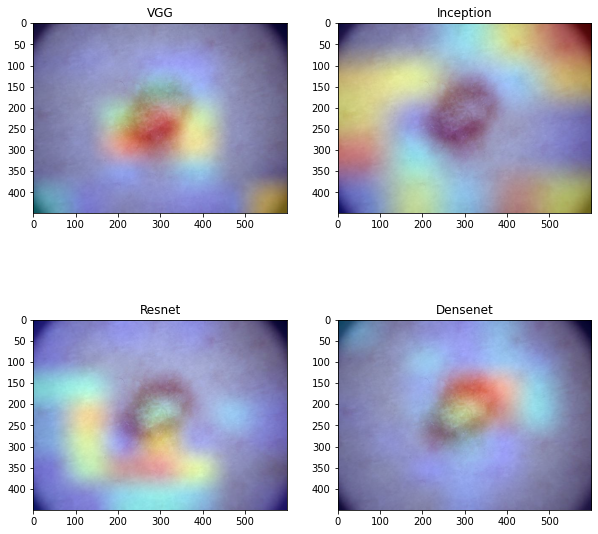

In [ ]:
show_gradcam(img_path_dermatofibroma, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)

### Keratosis

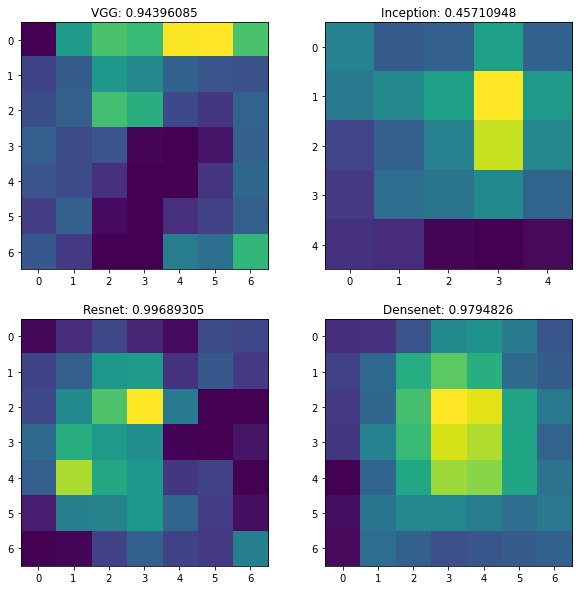

In [ ]:
img_array = get_img_array(img_path_keratosis, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,3)

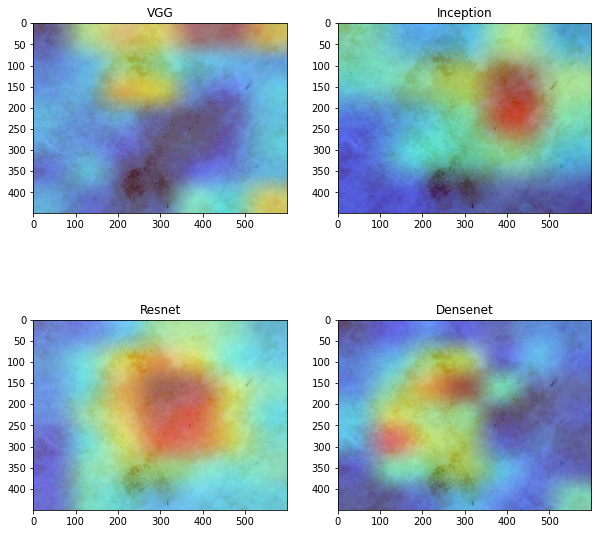

In [ ]:
show_gradcam(img_path_keratosis, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)

### Melanoma

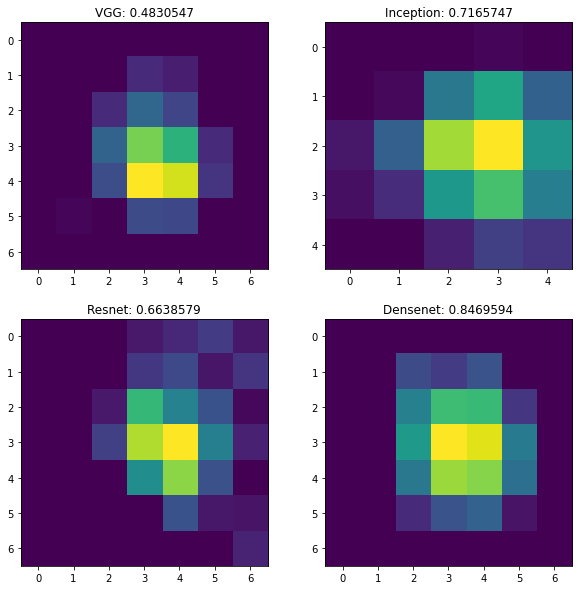

In [ ]:
img_array = get_img_array(img_path_melanoma, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,4)

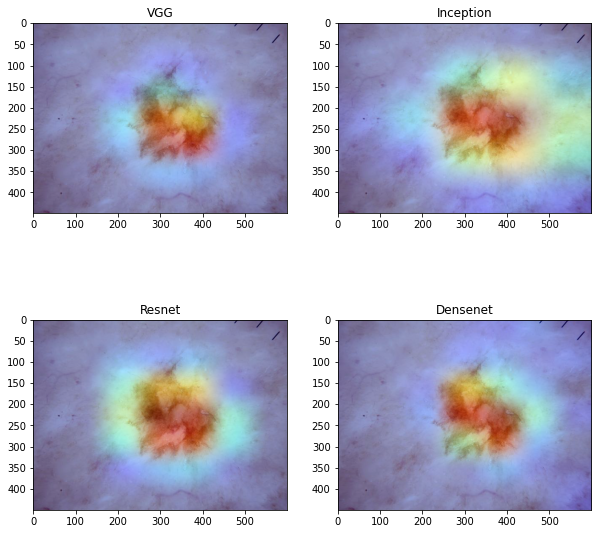

In [ ]:
show_gradcam(img_path_melanoma, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)

### Nevu

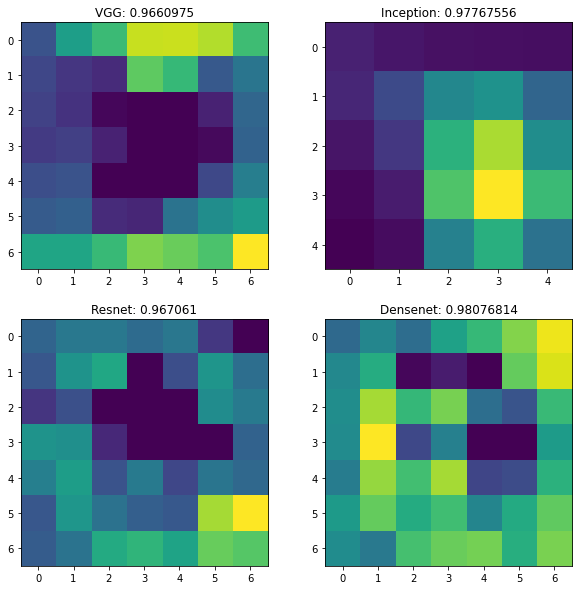

In [ ]:
img_array = get_img_array(img_path_nevu, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,5)

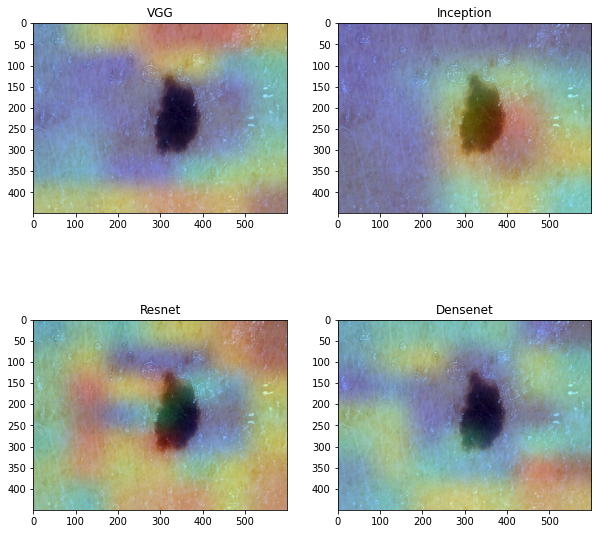

In [ ]:
show_gradcam(img_path_nevu, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)

### Vascular

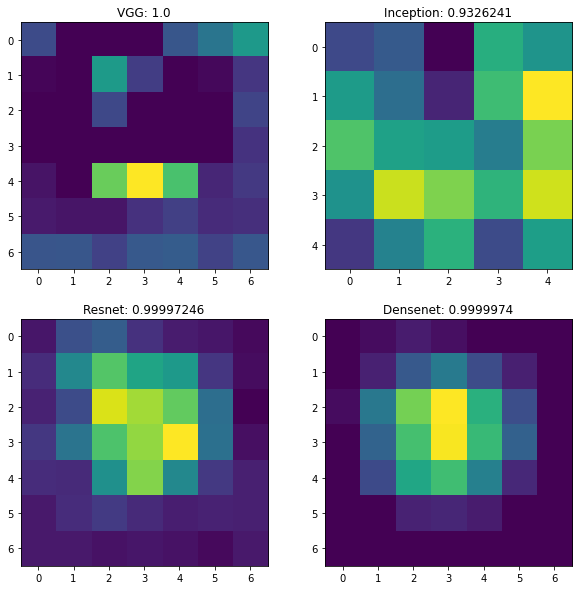

In [ ]:
img_array = get_img_array(img_path_vascular, IMAGE_SIZE)
heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet = show_heatmap(img_array,6)

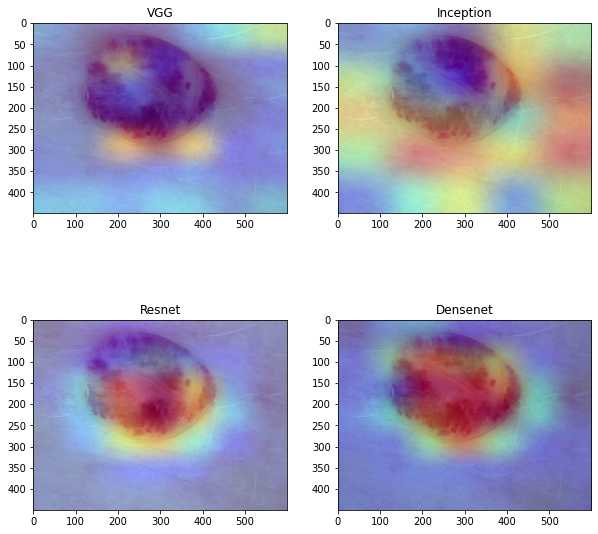

In [ ]:
show_gradcam(img_path_vascular, heatmap_vgg, heatmap_inception, heatmap_densenet, heatmap_resnet)